We are going to work on the 'Financial Inclusion in Africa' dataset that was provided as part of the Financial Inclusion in Africa hosted by the Zindi platform.

Dataset description: The dataset contains demographic information and what financial services are used by approximately 33,600 individuals across East Africa. The ML model role is to predict which individuals are most likely to have or use a bank account.

The term financial inclusion means:  individuals and businesses have access to useful and affordable financial products and services that meet their needs – transactions, payments, savings, credit and insurance – delivered in a responsible and sustainable way.


Instructions

Install the necessary packages

Import you data and perform basic data exploration phase

Display general information about the dataset

Create a pandas profiling reports to gain insights into the dataset

Handle Missing and corrupted values

Remove duplicates, if they exist

Handle outliers, if they exist

Encode categorical features

Based on the previous data exploration train and test a machine learning classifier

Create a streamlit application (locally) and add input fields for your features and a validation button at the end of the form

Import your ML model into the streamlit application and start making predictions given the provided features values

Deploy your application on Streamlit share:

Create a github and a streamlit share accounts

Create a new git repo

Upload your local code to the newly created git repo
log in to your streamlit account an deploy your application from the git repo


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
financial_Inclusion = pd.read_csv('/content/drive/MyDrive/Financial_inclusion_dataset.csv')
financial_Inclusion.head()

,country,year,uniqueid,bank_account,location_type,cellphone_access,household_size,age_of_respondent,gender_of_respondent,relationship_with_head,marital_status,education_level,job_type
0,Kenya,2018,uniqueid_1,Yes,Rural,Yes,3,24,Female,Spouse,Married/Living together,Secondary education,Self employed
1,Kenya,2018,uniqueid_2,No,Rural,No,5,70,Female,Head of Household,Widowed,No formal education,Government Dependent
2,Kenya,2018,uniqueid_3,Yes,Urban,Yes,5,26,Male,Other relative,Single/Never Married,Vocational/Specialised training,Self employed
3,Kenya,2018,uniqueid_4,No,Rural,Yes,5,34,Female,Head of Household,Married/Living together,Primary education,Formally employed Private
4,Kenya,2018,uniqueid_5,No,Urban,No,8,26,Male,Child,Single/Never Married,Primary education,Informally employed


In [3]:
financial_Inclusion.columns


Index(['country', 'year', 'uniqueid', 'bank_account', 'location_type',
       'cellphone_access', 'household_size', 'age_of_respondent',
       'gender_of_respondent', 'relationship_with_head', 'marital_status',
       'education_level', 'job_type'],
      dtype='object')

In [4]:
financial_Inclusion.shape

(23524, 13)

In [5]:
financial_Inclusion.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23524 entries, 0 to 23523
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   country                 23524 non-null  object
 1   year                    23524 non-null  int64 
 2   uniqueid                23524 non-null  object
 3   bank_account            23524 non-null  object
 4   location_type           23524 non-null  object
 5   cellphone_access        23524 non-null  object
 6   household_size          23524 non-null  int64 
 7   age_of_respondent       23524 non-null  int64 
 8   gender_of_respondent    23524 non-null  object
 9   relationship_with_head  23524 non-null  object
 10  marital_status          23524 non-null  object
 11  education_level         23524 non-null  object
 12  job_type                23524 non-null  object
dtypes: int64(3), object(10)
memory usage: 2.3+ MB


In [6]:
!pip install ydata-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.2/356.2 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 23.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 37.3 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=232bafde17ebaa0c704a2500a7aa8f83a8dd5d2f1a16e6f04244f0ba60b86217
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [20]:
from ydata_profiling import ProfileReport
profile = ProfileReport(financial_Inclusion, title=("financial Inclusion"))
profile.to_widgets()

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:533: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [22]:
financial_Inclusion.describe()

,country,year,uniqueid,bank_account,location_type,cellphone_access,household_size,age_of_respondent,gender_of_respondent,relationship_with_head,marital_status,education_level,job_type
count,23524.000000,23524.000000,23524.000000,23524.000000,23524.000000,23524.000000,23524.000000,23524.000000,23524.000000,23524.000000,23524.000000,23524.000000,23524.000000
mean,1.202091,2016.975939,3627.771340,0.140792,0.390282,0.741966,3.797483,38.805220,0.410092,2.217267,2.392748,1.994941,5.433770
std,0.925101,0.847371,2391.462551,0.347815,0.487824,0.437562,2.227613,16.520569,0.491861,1.893394,0.999477,1.205290,3.088706
min,0.000000,2016.000000,0.000000,0.000000,0.000000,0.000000,1.000000,16.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,2016.000000,1541.000000,0.000000,0.000000,0.000000,2.000000,26.000000,0.000000,1.000000,2.000000,2.000000,2.000000
50%,1.000000,2017.000000,3438.000000,0.000000,0.000000,1.000000,3.000000,35.000000,0.000000,1.000000,2.000000,2.000000,5.000000
75%,2.000000,2018.000000,5335.000000,0.000000,1.000000,1.000000,5.000000,49.000000,1.000000,5.000000,3.000000,3.000000,9.000000
max,3.000000,2018.000000,8734.000000,1.000000,1.000000,1.000000,21.000000,100.000000,1.000000,5.000000,4.000000,5.000000,9.000000


In [23]:
financial_Inclusion.isnull().sum()

country                   0
year                      0
uniqueid                  0
bank_account              0
location_type             0
cellphone_access          0
household_size            0
age_of_respondent         0
gender_of_respondent      0
relationship_with_head    0
marital_status            0
education_level           0
job_type                  0
dtype: int64

In [24]:
financial_Inclusion.duplicated().sum()

0

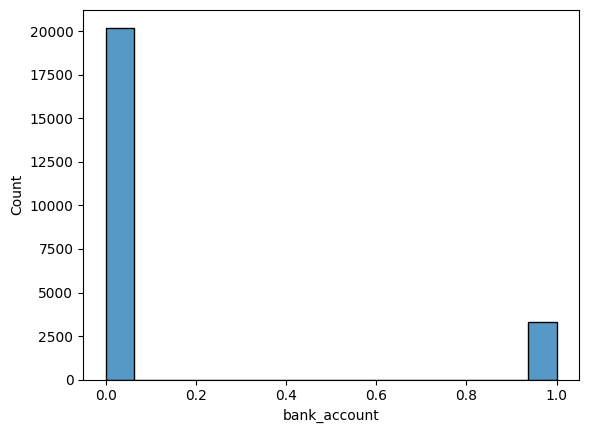

In [25]:
sns.histplot(financial_Inclusion['bank_account'])
plt.show()

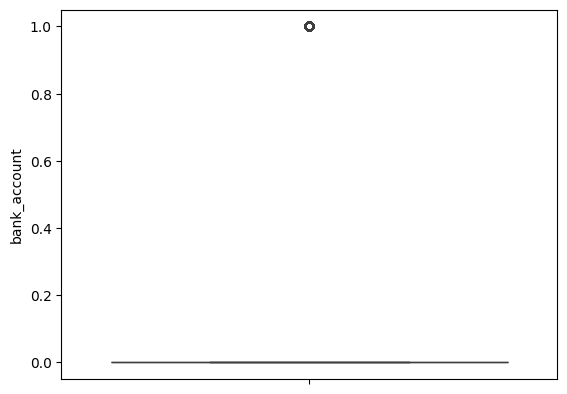

In [26]:
sns.boxplot(financial_Inclusion['bank_account'])
plt.show()

In [27]:
#Convert categorical data to numerical data using lebel encoding
from sklearn import preprocessing
lebel = preprocessing.LabelEncoder()


In [28]:
financial_enc = financial_Inclusion.select_dtypes(include=['object']).columns
for column in financial_enc: # Convert Categorical Data to Numerical
    financial_Inclusion[column] = lebel.fit_transform(financial_Inclusion[column]) # Use lebel instead of Label
financial_Inclusion.head()

,country,year,uniqueid,bank_account,location_type,cellphone_access,household_size,age_of_respondent,gender_of_respondent,relationship_with_head,marital_status,education_level,job_type
0,0,2018,0,1,0,1,3,24,0,5,2,3,9
1,0,2018,1111,0,0,0,5,70,0,1,4,0,4
2,0,2018,2222,1,1,1,5,26,1,3,3,5,9
3,0,2018,3333,0,0,1,5,34,0,1,2,2,3
4,0,2018,4444,0,1,0,8,26,1,0,3,2,5


In [29]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report,accuracy_score,confusion_matrix


In [32]:
# Define features and target
#select the target variable and the features
features = ['country', 'year', 'location_type',
       'cellphone_access', 'household_size', 'age_of_respondent',
       'gender_of_respondent', 'relationship_with_head', 'marital_status',
       'education_level', 'job_type']
x = financial_Inclusion[features]
y = financial_Inclusion['bank_account']

In [33]:
# Standardize data to avoid high variations in the data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = scaler.fit_transform(x)

In [34]:
#Split Dataset into Training and Test Sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=30)

In [35]:
model = LogisticRegression() # Instantiate model
model.fit(x_train, y_train) # Fit or train model with train dataset using X_train

LogisticRegression()

In [36]:
#fitting our model
model = LogisticRegression()
model.fit(x_train, y_train)
y_pred = model.predict(x_test)

# evaluating our model
print("score:{} ".format(accuracy_score(y_test, y_pred)))
print("matrix:{}".format(confusion_matrix(y_test, y_pred)))
print("report:{} ".format(classification_report(y_test, y_pred)))


score:0.873538788522848 
matrix:[[3949   74]
 [ 521  161]]
report:              precision    recall  f1-score   support

           0       0.88      0.98      0.93      4023
           1       0.69      0.24      0.35       682

    accuracy                           0.87      4705
   macro avg       0.78      0.61      0.64      4705
weighted avg       0.85      0.87      0.85      4705
 


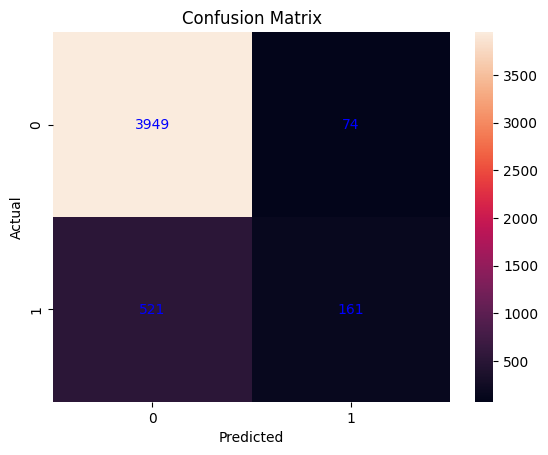

[[3949   74]
 [ 521  161]]


<Figure size 600x400 with 0 Axes>

In [37]:
#Using confusion matrice to visualize the performance of classification algorithm
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d',annot_kws={"color": "blue"})
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()
plt.figure(figsize=(6, 4))
print(conf_matrix)

In [39]:
!pip install pypickle

In [40]:
import pypickle
filepath = 'financial.pkl' # save the work as (.pkl) in variable filepath
pypickle.save(filepath,model) # save the model and filepath

[pypickle] Pickle file saved: [financial.pkl]


True